In [1]:
%matplotlib inline

import networkx as nx
from networkx.algorithms import community, bridges, smallworld
import numpy as np
import matplotlib.pyplot as plt

import shutil

import collections

from scipy import stats, optimize

import imageio

from sympy.solvers import solve
from sympy import Symbol

import time

import os

from IPython.display import Image

import copy

from tqdm import tnrange, tqdm_notebook

import community as cm

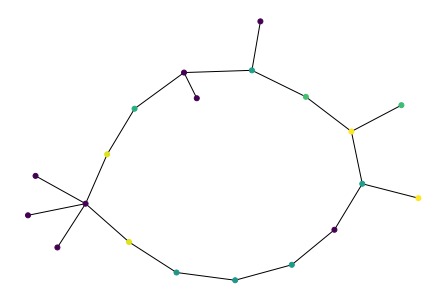

In [2]:
lower = 0
upper = 1
mu = upper / 2
sigma = np.sqrt(mu) / 2

thresh = 0.95

prob_adopted = 0.5

neighbor_thresh = 5/100
sim_thresh = 0.15

product_adoption_jitter = sigma / 12

make_gif = True

calc_omega = False

iters = 250

ims = []

product_dist = stats.truncnorm((lower - mu)/sigma, (upper - mu)/sigma, loc=mu, scale=sigma)
# schelling_dist = stats.truncnorm((0 - 0.5)/0.15, (1 - 0.5)/0.15, loc=0.5, scale=0.25)

def random_product():
    return np.random.choice([np.random.beta(0.75, 0.75)*upper, -1], p=[prob_adopted, 1 - prob_adopted])
#     return np.random.choice([np.random.rand()*upper, -1], p=[prob_adopted, 1 - prob_adopted])

def gauss_random_product():
    return np.random.choice([product_dist.rvs(), -1], p=[prob_adopted, 1 - prob_adopted])

def random_schelling():
    return np.random.rand() * 4/5

init = 20

G = nx.connected_watts_strogatz_graph(init, 3, np.random.rand())

products = dict([(i, random_product()) for i in range(init)])
thresholds = dict([(i, np.random.rand() * 2 / 3) for i in range(init)])
schellings = dict([(i, random_schelling()) for i in range(init)])

nx.set_node_attributes(G, products, 'apt_markakis')
nx.set_node_attributes(G, thresholds, 'threshold')
nx.set_node_attributes(G, schellings, 'schelling')

attrs = [nx.get_node_attributes(G, 'apt_markakis')[i] for i in G]

nx.draw_kamada_kawai(G, node_color=attrs, node_size=25)

In [3]:
def barabasi_step(graph):
    tot = graph.number_of_edges() * 2
    probs = [val / tot for (_, val) in graph.degree()]
    rands = np.random.uniform(size=len(probs))
    check = [rands[i] <= probs[i] for i in range(len(probs))]
    while not True in check:
        rands = np.random.uniform(size=len(probs))
        check = [rands[i] <= probs[i] for i in range(len(probs))]
    new_prod = random_product()
    graph.add_node(len(rands), apt_markakis = new_prod, schelling = random_schelling(), threshold=np.random.rand())
    graph.add_edges_from([(len(rands), i) for i in range(len(rands)) if check[i]])
    
def threshold_met(graph, node):
    neighbors = [graph.node[x]['apt_markakis'] for x in graph[node]]
    if neighbors:
        return (sum([1 for x in neighbors if x > -1]) / len(neighbors)) > graph.node[node]['threshold']
    return False
    
def apt_markakis_step_med(graph):
    unset = [x for x in graph.nodes if graph.node[x]['apt_markakis'] < 0]
    candidates = [x for x in unset if threshold_met(graph, x)]
    if candidates:
        tar = np.random.choice(candidates)
        neighbors = [graph.node[x]['apt_markakis'] for x in graph.nodes if graph.node[x]['apt_markakis'] > -1]
        neighbor_med = np.median([graph.node[x]['apt_markakis'] for x in graph.nodes if graph.node[x]['apt_markakis'] > -1])
        adopted = np.random.normal() * product_adoption_jitter + neighbor_med
        while adopted < 0 or adopted > upper:
            adopted = np.random.normal() * product_adoption_jitter + neighbor_med
        graph.node[tar]['apt_markakis'] = adopted
    
def bucket(neighbor_list, n_buckets):
    buckets = [0] * n_buckets
    for n in neighbor_list:
        idx = int(n * n_buckets)
        buckets[idx] += 1
        
    buckets = [b / sum(buckets) for b in buckets]
    
    neighbor_med = np.random.choice(n_buckets, p=buckets) / n_buckets
        
    return neighbor_med
    
def bucket_markakis(graph):
    unset = [x for x in graph.nodes if graph.node[x]['apt_markakis'] < 0]
    candidates = [x for x in unset if threshold_met(graph, x)]
    if not candidates:
        return
    tar = np.random.choice(candidates)
    neighbor_list = [graph.node[x]['apt_markakis'] for x in graph.nodes if graph.node[x]['apt_markakis'] > -1]
    
    n_buckets = 100

    buckets = [0] * n_buckets
    for n in neighbor_list:
        idx = int(n * n_buckets)
        buckets[idx] += 1
        
    buckets = [b / sum(buckets) for b in buckets]
    
    neighbor_med = np.random.choice(n_buckets, p=buckets) / n_buckets

    
    adopted = np.random.normal() * product_adoption_jitter + neighbor_med
    while adopted < 0 or adopted > upper:
        adopted = np.random.normal() * product_adoption_jitter + neighbor_med

    graph.node[tar]['apt_markakis'] = adopted
    
def apt_markakis_step_avg(graph):
    unset = [x for x in graph.nodes if graph.node[x]['apt_markakis'] < 0]
    candidates = [x for x in unset if threshold_met(graph, x)]
    if candidates:
        tar = np.random.choice(candidates)
        neighbor_avg = np.average([graph.node[x]['apt_markakis'] for x in graph.nodes if graph.node[x]['apt_markakis'] > -1])
        adopted = np.random.normal() * product_adoption_jitter + neighbor_avg
        while adopted < 0:
            adopted = np.random.normal() * product_adoption_jitter + neighbor_avg
        graph.node[tar]['apt_markakis'] = adopted
        
def unhappy(graph, node):
    neighbors = [graph.node[x]['apt_markakis'] for x in graph[node] if graph.node[x]['apt_markakis'] > -1]
    if not neighbors:
        return False
    dif_neighbors = [x for x in neighbors if np.abs(graph.node[node]['apt_markakis'] - x) / graph.node[node]['apt_markakis'] > neighbor_thresh]
    return len(dif_neighbors) / len(neighbors) > sim_thresh

def similar(graph, node):
    set_nodes = [x for x in graph.nodes() if graph.node[x]['apt_markakis'] > -1]
    similars =  [x for x in set_nodes if np.abs(graph.node[node]['apt_markakis'] - graph.node[x]['apt_markakis']) / graph.node[node]['apt_markakis'] <= neighbor_thresh]
    return [x for x in similars if not (graph.has_edge(x, node) or graph.has_edge(node, x)) ]
    
def dif_nodes(graph, node):
    neighbors = [x for x in graph[node] if graph.node[x]['apt_markakis'] > -1]
    difs =  [x for x in neighbors if np.abs(graph.node[node]['apt_markakis'] - graph.node[x]['apt_markakis']) / graph.node[node]['apt_markakis'] > neighbor_thresh]
    return difs

    
def neighbor_dist_avg(graph, node):
    neighbors = [graph.node[x]['apt_markakis'] for x in graph[node] if graph.node[x]['apt_markakis'] > -1]
    if neighbors:
        return np.sqrt(np.sum([(neighbor - graph.node[node]['apt_markakis'])**2 for neighbor in neighbors])) / len(neighbors)
    return np.inf
    
def euclidian(graph, node, vec):
    return np.sum([np.abs(graph.node[node]['apt_markakis'] - graph.node[n]['apt_markakis']) for n in vec]) / len(vec)
#     return np.sqrt(np.sum([(graph.node[neighbor]['apt_markakis'] - graph.node[node]['apt_markakis'])**2 for neighbor in vec])) / len(vec)
    
def schelling_step_avg(graph):
    adopted = [x for x in graph.nodes if graph.node[x]['apt_markakis'] > -1]
    candidates = [x for x in adopted if unhappy(graph, x)]
    add_ctr = 0
    rem_ctr = 0
    if candidates:
        tar = np.random.choice(candidates)
        
        tot = sum([np.e**x for x in probs])
        probs = [np.e**x / tot for x in probs]
        friends = list(set([n for i in G[tar] for n in G[i]]))
        friend_probs = [1 / (len(friends)) if x in friends else 0 for x in range(len(probs))]
        probs = [0.4 * probs[i] + 0.6 * friend_probs[i] for i in range(len(probs))]
        test_pts = np.random.choice(len(probs), p=probs, replace=False, size=len(probs))
        test_pts = [test for test in test_pts if graph.node[test]['apt_markakis'] > -1]
        bs = list(bridges(graph))
        for test in test_pts:

            neighbors = [x for x in graph[tar] if graph.node[x]['apt_markakis'] > -1]
            neighbor_dist = euclidian(graph, tar, neighbors)
            if graph.has_edge(test, tar) and (test, tar) not in bs and (tar, test) not in bs:
                neighbor_test = copy.deepcopy(neighbors)
                neighbor_test.remove(test)
                if euclidian(graph, tar, neighbor_test) / neighbor_dist < thresh:
                    graph.remove_edge(test, tar)
                    bs = list(bridges(graph))
                    rem_ctr += 1
            elif euclidian(graph, tar, neighbors + [test]) / neighbor_dist < thresh:
                graph.add_edge(test, tar)
                add_ctr += 1
            if not unhappy(graph, tar):
                print("breaking")
                break
            
def improved_schelling(graph):
    adopted = [x for x in graph.nodes if graph.node[x]['apt_markakis'] > -1]
    candidates = [x for x in adopted if unhappy(graph, x)]
    add_ctr = 0
    rem_ctr = 0
    if not candidates:
        return
    
    tar = np.random.choice(candidates)
    similars = similar(graph, tar)
    sim_vals = [True for _ in similars]
    difs = dif_nodes(graph, tar)
    dif_vals = [False for _ in difs]
    
    test_pts = similars + difs
    test_vals = sim_vals + dif_vals
    
    degrees = [graph.degree[x] for x in test_pts]
    degrees = [degrees[i] / 4 if test_vals[i] else degrees[i] for i in range(len(degrees))]
    degrees = [x/sum(degrees) for x in degrees]
    
    indices = np.random.choice(len(degrees), p=degrees, replace=False, size=len(degrees))
    
    bs = list(bridges(graph))
    for idx in indices:
        if test_vals[idx]:
            graph.add_edge(tar, test_pts[idx])
            add_ctr += 1
        else:
            if not (test_pts[idx], tar) in bs and not (tar, test_pts[idx]) in bs:
                graph.remove_edge(test_pts[idx], tar)
                bs = list(bridges(graph))
                rem_ctr += 1
        if not unhappy(graph, tar):
            break
            
#     print(tar, add_ctr, rem_ctr)
                
def draw_attrs(graph):
#     communities = cm.best_partition(G)
#     attrs = [communities.get(node) for node in G.nodes()]
#     nx.draw_kamada_kawai(graph, node_color=attrs, node_size=25, cmap='tab20')

    attrs = [nx.get_node_attributes(graph, 'apt_markakis')[i] for i in graph.nodes]
    nx.draw_kamada_kawai(graph, node_color=attrs, node_size=25)

In [4]:
if os.path.exists('runs/graphs'):
    shutil.rmtree('runs/graphs')
os.makedirs('runs/graphs/')

paths = []
clusterings = []
dims = []

for i in tnrange(iters, desc='executing model'):
    nx.write_graphml(G, 'runs/graphs/m' + str(i) + '.graphml')
    if make_gif:
        draw_attrs(G)
        fname = "images/frames/j_model" + str(i) + ".png"
        plt.savefig(fname)
        ims.append(fname)
        plt.cla()
        plt.clf()
        
#     if i%close_iter == 0:
#         edge_decay(G)
#         close(G, close_iter)
#     neighbor_thresh = 1 / (((i+1)**0.7) / 0.7)
    barabasi_step(G)
    bucket_markakis(G)
#     apt_markakis_step_avg(G)
#     print('=========' + str(i) + '===========')
    improved_schelling(G)
    improved_schelling(G)
#     print('-------------------------------')
    
#     if i%50 == 0:
#         paths.append(nx.average_shortest_path_length(G))
#         clusterings.append(nx.average_clustering(G))
        
#         l2 = sorted(nx.linalg.spectrum.laplacian_spectrum(G))
#         print(l2[:3])
#         x = Symbol('x')

#         dims.append(solve(G.number_of_nodes()**(-2/x) - l2[1])[0])
    
#     if i in [880, 890] or (np.random.rand() < 0.01 and i > 500):
#         print("anomaly at step: ", i)
        
#         changes = np.random.choice(G.number_of_nodes(), 50)
#         for node in changes:
#             temp = random_product()
#             while temp < 0:
#                 temp = random_product()
#             G.node[node]['apt_markakis'] = temp
#         for _ in range(50):
#             improved_schelling(G)
            
nx.write_graphml(G, 'runs/graphs/m' + str(iters) + '.graphml')

<Figure size 432x288 with 0 Axes>

generated model


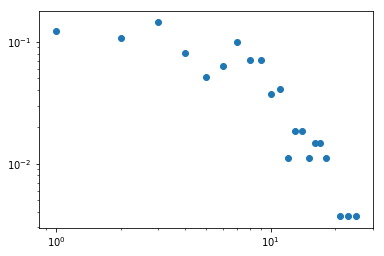

true scale free


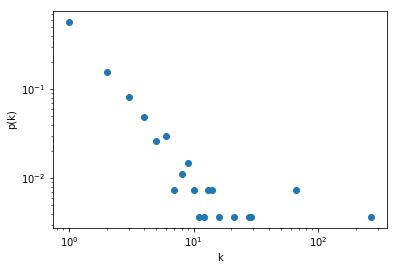

In [5]:
sg = nx.scale_free_graph(G.number_of_nodes())

print('generated model')
degree_sequence = [d for (n, d) in G.degree()]
degreeCount = collections.Counter(degree_sequence)
deg, cnt = zip(*degreeCount.items())

tot = sum(cnt)
per = [c / tot for c in cnt]

plt.xscale('log')
plt.yscale('log')
plt.scatter(deg, per)
plt.show()

print('true scale free')
degree_sequence = [d for (n, d) in sg.degree()]
degreeCount = collections.Counter(degree_sequence)
deg, cnt = zip(*degreeCount.items())

tot = sum(cnt)
per = [c / tot for c in cnt]

plt.xscale('log')
plt.yscale('log')
plt.xlabel('k')
plt.ylabel('p(k)')

plt.scatter(deg, per)
plt.show()

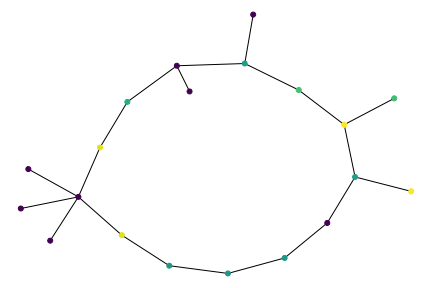

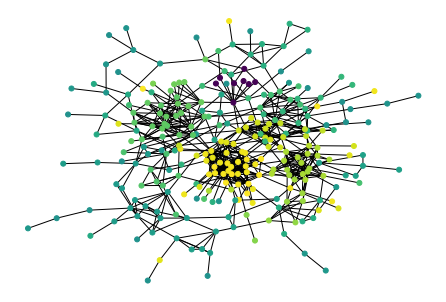

In [18]:
# for node in G.nodes:
#     if G.node[node]['apt_markakis'] < 0:
#         G.node[node]['apt_markakis'] = 0

draw_attrs(G)
fname = "images/frames/final" + str(int(time.time())) + '.png'
plt.savefig(fname)

if make_gif:
    ims += [fname] * 10

    files = []
    for im in ims:
        files.append(imageio.imread(im))

    gif_name = 'images/runs/' + str(int(time.time())) + '.gif'
    imageio.mimsave(gif_name, files, duration=0.5)
    
    with open(gif_name,'rb') as f:
        display(Image(data=f.read(), format='png'))

(array([ 8.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,  0.,
         0.,  0., 29., 32., 14., 19., 19., 10., 16., 21.,  7.,  3.,  9.,
        16., 15., 15., 37.]),
 array([-1.00000000e+00, -9.33335641e-01, -8.66671283e-01, -8.00006924e-01,
        -7.33342566e-01, -6.66678207e-01, -6.00013849e-01, -5.33349490e-01,
        -4.66685132e-01, -4.00020773e-01, -3.33356415e-01, -2.66692056e-01,
        -2.00027698e-01, -1.33363339e-01, -6.66989810e-02, -3.46224574e-05,
         6.66297360e-02,  1.33294095e-01,  1.99958453e-01,  2.66622812e-01,
         3.33287170e-01,  3.99951529e-01,  4.66615887e-01,  5.33280246e-01,
         5.99944604e-01,  6.66608963e-01,  7.33273321e-01,  7.99937680e-01,
         8.66602038e-01,  9.33266397e-01,  9.99930755e-01]),
 <a list of 30 Patch objects>)

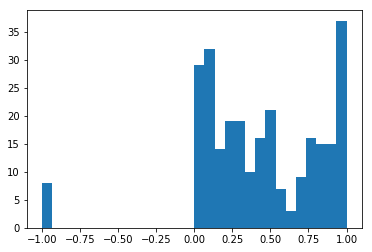

In [7]:
plt.hist([nx.get_node_attributes(G, 'apt_markakis')[i] for i in G.nodes], bins=30)
# plt.title('Histogram with Buckets')
# plt.savefig('hist4.png', dpi=2160)

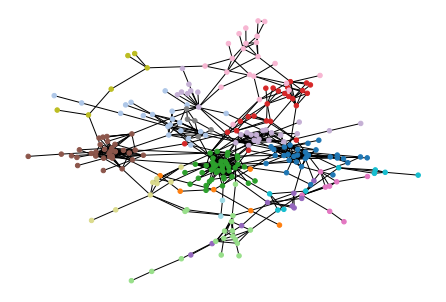

best communities
0.7970792507039673


In [8]:
communities = cm.best_partition(G)
best_vec = [communities.get(node) for node in G.nodes()]
mod = cm.modularity(communities, G)
    
nx.draw(G, node_size=20, node_color=best_vec, cmap='tab20')
# plt.savefig('communities.png')
plt.show()
print("best communities")
print(mod)

In [9]:
if calc_omega:
    omega = smallworld.omega(G)
    print(omega)

In [10]:
# G.remove_edges_from(nx.selfloop_edges(G))

# kore = nx.k_core(G)

# kore.number_of_nodes()

In [11]:
nx.average_clustering(G)

0.31724415636251385

In [12]:
nx.average_shortest_path_length(G)

5.095332507228418

In [13]:
l2 = sorted(nx.linalg.spectrum.laplacian_spectrum(G))
l2[:5]

[-7.786517949033702e-16,
 0.08311825807983897,
 0.10911998671584908,
 0.13415708221449765,
 0.14695575307533384]

In [14]:
x = Symbol('x')

solve(G.number_of_nodes()**(-2/x) - l2[1])

[4.50126027277217, 0.609907367263264 - 1.54057288230424*I]

(array([37., 41., 25., 23., 13., 12., 19., 12., 11., 12., 10.,  9.,  7.,
         6.,  5.,  3.,  3.,  5.,  3.,  4.,  3.,  3.,  1.,  0.,  0.,  0.,
         1.,  0.,  1.,  1.]),
 array([-7.78651795e-16,  8.10533282e-01,  1.62106656e+00,  2.43159984e+00,
         3.24213313e+00,  4.05266641e+00,  4.86319969e+00,  5.67373297e+00,
         6.48426625e+00,  7.29479953e+00,  8.10533282e+00,  8.91586610e+00,
         9.72639938e+00,  1.05369327e+01,  1.13474659e+01,  1.21579992e+01,
         1.29685325e+01,  1.37790658e+01,  1.45895991e+01,  1.54001323e+01,
         1.62106656e+01,  1.70211989e+01,  1.78317322e+01,  1.86422655e+01,
         1.94527988e+01,  2.02633320e+01,  2.10738653e+01,  2.18843986e+01,
         2.26949319e+01,  2.35054652e+01,  2.43159984e+01]),
 <a list of 30 Patch objects>)

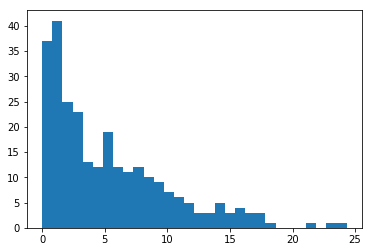

In [15]:
plt.hist(l2, bins=30)

In [16]:
# # ref = nx.read_graphml('runs/graphs2/m2500.graphml')
# # ref = nx.read_graphml('hepth/graphs/0.graphml')
# ref = G

# nx.draw(ref, node_size=15)

# true_len = nx.average_shortest_path_length(ref)
# true_clus = nx.average_clustering(ref)

# lens = []
# clusts = []

# for _ in tqdm_notebook(range(50)):
#     rand = nx.erdos_renyi_graph(ref.number_of_nodes(), ref.number_of_edges() / ref.number_of_nodes()**2)
#     while not nx.is_connected(rand):
#         rand = nx.erdos_renyi_graph(ref.number_of_nodes(), ref.number_of_edges() / ref.number_of_nodes()**2)
#     lens.append(nx.average_shortest_path_length(rand))
#     clusts.append(nx.average_clustering(rand))
    
# ref_len = sum(lens) / len(lens)
# ref_clus = sum(clusts) / len(clusts)

# print(true_len, true_clus)
# print(ref_len, ref_clus)
# print(true_len / ref_len, true_clus / ref_clus)